<Body>   
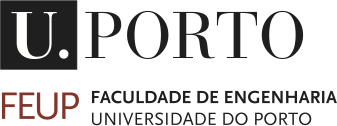   

# Assignment 1

**Computer Vision**

Master in Data Science and Engineering

Faculdade de Engenharia da Universidade do Porto


Helena Costa (202302812) | Lara Neves (202007579)

Novembro 2024



---



<a id="ref1"></a>
## Assignment Statement

The sorting center of a M&M factory retrieves visual data from the production line to determine the type of chocolates produced. The factory uses a computer vision application to automatically calculate some properties of the sample, namely:
* the **distribution of each color** in the sample, e.g., the number of red (or blue or ...) chocolates. At the end, if the sample does not have chocolate of all colors, the system must raise an alarm by printing “Color XPTO is missing”;
* identify the **type of peanuts** in the line, namely with or without peanut;
* the **average shape area** of all chocolates in millimeters and organized by color

Considering these requirements, we will explore and answer several questions.

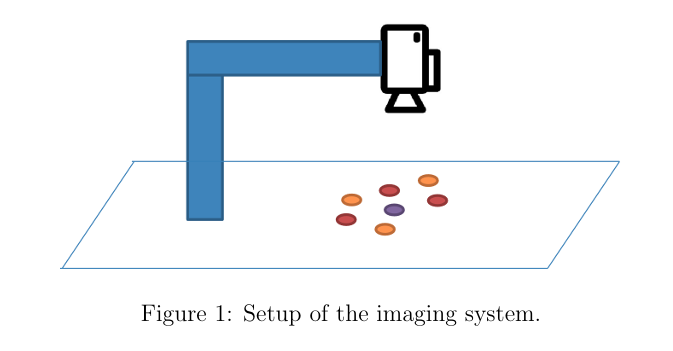

## Import libraries

In [41]:
import numpy as np
import pandas as pd
import cv2 as cv
import glob
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import webcolors
from tabulate import tabulate
import os


In [42]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1. **Calibrate the intrinsic parameters and lens distortion of the camera. Show the intrinsic matrix, the lens distortion coefficients and the re-projection error.**



Radial distortion causes straight lines to appear curved, while tangential distortion makes the image look nearer than expected because the image-taking lense is not aligned perfectly parallel to the imaging plane.



Verification of pre-requisites:

* Documentation states we need at least 10 test patterns for camera calibration. In this exercise, we have 35.
* Calibration pattern (chessboard images) is flat and kept stationary at XY plane
* The grid is 5x8 and the number of corners is 4x7
* Checker size = 22mm


To solve question a), we followed the documentation available on [1] and used "cv.findChessboardCorners() function from OpenCV library to identify and locate the corners of the chessboard pattern in the given images.





In [43]:
path = '/content/drive/MyDrive/VC/calib/*.png'
images = glob.glob(path)

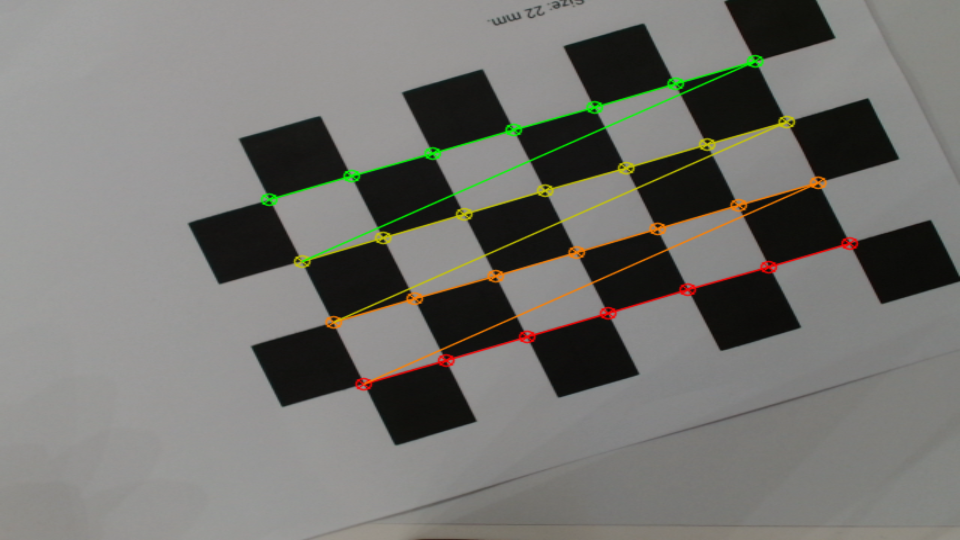

In [44]:
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)  # Termination criteria

rows, cols = 4, 7
square_size = 22

objp = np.zeros((rows * cols, 3), np.float32)
objp[:, :2] = np.mgrid[0:cols, 0:rows].T.reshape(-1, 2)
objp *= square_size  # Scale the object points by the real-world square size

objpoints = []  # 3D points in real-world space
imgpoints = []  # 2D points in image plane

error = 0
for fname in images:
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    ret, corners = cv.findChessboardCorners(gray, (cols, rows), None)    # Detect corners on the checkerboard

    if ret:
        # If corners are found, refine them and store the points
        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)

        # Draw the corners on the image for verification
        cv.drawChessboardCorners(img, (cols, rows), corners2, ret)
        last_img_prt = cv.resize(img, (960, 540))
    else:
        error += 1
        print(f"No corners found in {fname}.")

cv2_imshow(last_img_prt)

To get the intrinsic matrix, the lens distortion coefficients and the re-projection error, we will use the function *calibrateCameraExtended* from OpenCV (available on [2]) that returns the following:

* mtx: 3x3 floating-point camera **intrinsic matrix** that can be used to easily get the 3x4 camera matrix (adding a column of zero values)



> $
\begin{aligned}
\begin{equation}
calibration\ matrix =
\begin{bmatrix}
fx & 0 & cx\\
0 & fy & cy\\
0 & 0 & 1
\end{bmatrix}
 \\
\end{equation}
\end{aligned}
$

>$
\begin{aligned}
\begin{equation}
instrinsic\ matrix =
\begin{bmatrix}
fx & 0 & cx & 0\\
0 & fy & cy & 0\\
0 & 0 & 1 & 0
\end{bmatrix}
\end{equation}
\end{aligned}
$


 where:

>$
\begin{aligned}
\begin{equation}
(fx, fy) = focal\ length,
\end{equation}
\end{aligned}
$

>$
\begin{aligned}
\begin{equation}
(cx, cy) =  pixel\ coordinates\ of\ the\ camera\ optical\ center.
\end{equation}
 \\
\end{aligned}
$




* dist: distortion coefficients


> $
\begin{aligned}
\begin{equation}
[k1, k2, p1, p2, k3]
\end{equation}
 \\
\end{aligned}
$

>$
\begin{aligned}
\begin{equation}
k1,\ k2,\ k3\ = Radial\ distortion\ coefficients\ of\ the\ lens.
\end{equation}
 \\
\end{aligned}
$

>$
\begin{aligned}
\begin{equation}
p1\, p2\ = Tangential\ distortion\ coefficients\ of\ the\ lens.
\end{equation}
 \\
\end{aligned}
$


* rvecs: rotation vectors
* tvecs: translation vectors <br><br>

In [45]:
ret, mtx, dist, rvecs, tvecs,  std_devs_intrinsics, std_devs_extrinsics, per_view_errors = cv.calibrateCameraExtended(objpoints, imgpoints, gray.shape[::-1], None, None)
value=np.mean(per_view_errors)
print("Intrinsic matrix (camera matrix):")
print(mtx)
print()
print("Distortion coefficients:")
print(dist)
print()
print(f"Overall RMS Reprojection Error: {ret:.4f}")
print("or")
print(f"Simply the mean of the output vector of the RMS re-projection error estimated for each pattern view.: {value:.4f}")


Intrinsic matrix (camera matrix):
[[447.69340617   0.         334.35773537]
 [  0.         449.81740857 272.47359571]
 [  0.           0.           1.        ]]

Distortion coefficients:
[[ 2.01057326e-02 -5.12888775e-02  7.34540066e-05 -6.09893987e-04
   2.33793799e-02]]

Overall RMS Reprojection Error: 0.2107
or
Simply the mean of the output vector of the RMS re-projection error estimated for each pattern view.: 0.1944


where,
$
\begin{aligned}
\begin{equation}
(fx, fy) \approx (447.69, 449.82)
\end{equation}
\end{aligned}
$

$
\begin{aligned}
\begin{equation}
(cx, cy) \approx (334.36, 272.47)
\end{equation}
 \\
\end{aligned}
$

$
\begin{aligned}
\begin{equation}
[k1, k2, p1, p2, k3] = [2.01{\times 10^{-2}},\ -5.13{\times 10^{-2}},\ 7.34{\times 10^{-5}},\ -6.10{\times 10^{-4}},\ 2.34{\times 10^{-2}}]
\end{equation}
 \\
\end{aligned}
$


We calculated the re-projection error in two diferent ways and the results were quite similar, always **lower than 1 pixel unit**.



The *ret* value represents the overall RMS reprojection error, computed by taking into account all detected points across all views, and combining them in a simple calculation, applying the root mean square (RMS), and producing a single value that summarizes the calibration error across all views.


On the other hand, *value* represents the mean of the RMS reprojection errors calculated separately for each image. This means that each individual image’s reprojection error is averaged independently, without considering the total number of points or differences in error distribution between images. As a result, it might not capture the true overall error if there are significant variations between the images in terms of point counts or error patterns. For instance, if one image has significantly more points than another, or has a notably high or low reprojection error, this can lead to a discrepancy between ret and value.



---



# 2. **Calibrate the extrinsic parameters of the camera setup (or instead, use the extrinsic image to manually measure the dimensions of a black square of the chessboard in pixels. In this way, you will know the conversion between pixel to millimeter). Show the extrinsic matrix (rotation, translation, etc) and/or the conversion ratio between pixel to millimeter that was used**.

The process begins by reading an image of the chessboard and converting it to grayscale for improved corner detection accuracy.

The *cv.findChessboardCorners* function is then used to detect the chessboard corners. If corner detection is successful, *solvePnP* is called to estimate the camera’s pose relative to the chessboard. This function is crucial because it solves the Perspective-n-Point (PnP) problem, which determines the rotation and translation of the chessboard relative to the camera. It outputs *rvec*, a rotation vector, and *tvec*, a translation vector. Together, these vectors provide a description of the chessboard's orientation and position relative to the camera’s frame of reference.

The rotation vector *rvec* is then converted into a 3x3 rotation matrix R using *cv.Rodrigues*. This matrix describes the orientation of the chessboard relative to the camera, while tvec represents its position.

Finally, the extrinsic matrix is created by horizontally stacking R and tvec into a 3x4 matrix.

In [46]:
img = cv.imread('/content/drive/MyDrive/VC/chess.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
ret, corners = cv.findChessboardCorners(gray, (cols, rows), None)

if ret:
    # The solvePnP function estimates the rotation and translation
    success, rvec, tvec = cv.solvePnP(objp, corners, mtx, dist)

    # Generate the 3x3 rotation matrix from the rotation vector
    R, _ = cv.Rodrigues(rvec)

    extrinsic_matrix = np.hstack((R, tvec))

    print("Extrinsic matrix 3x4:")
    print(extrinsic_matrix)

Extrinsic matrix 3x4:
[[ 9.99921799e-01  1.02676888e-03 -1.24636506e-02 -6.99582052e+01]
 [-1.04007898e-03  9.99998896e-01 -1.06147866e-03 -5.81262379e+01]
 [ 1.24625469e-02  1.07435883e-03  9.99921762e-01  1.70493924e+02]]


To compute the conversion ratio between pixel to millimeter that was used, we'll define the square_size = 22 mm, according to the information in the image *chess.png* .

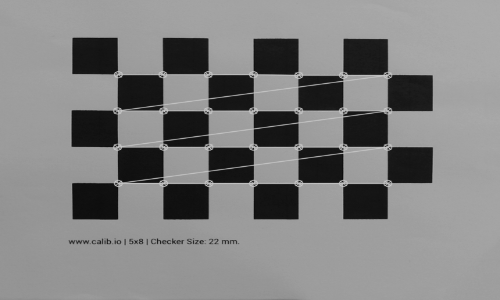

Each millimiter has 4.5168 pixels.
Each pixel has 0.2214 mm.


In [47]:
new_img = cv.imread('/content/drive/MyDrive/VC/chess.png')
gray_img = cv.cvtColor(new_img, cv.COLOR_BGR2GRAY)

chessboard_w, chessboard_h = 7, 4
ret, corners = cv.findChessboardCorners(gray_img, (chessboard_w, chessboard_h), None)

# Adjust position of corners according to precision criteria previously defined
corners = cv.cornerSubPix(gray_img, corners, (11, 11), (-1, -1), criteria)

distances = []
corner_mtx = corners.reshape(chessboard_w, chessboard_h, -1)
for row in corner_mtx:
    for corner_l, corner_r in zip(row, row[1:]):
        # Add distance between neighboring corners to the list
        distances.append(np.linalg.norm(corner_r - corner_l))

square_size_px = sum(distances) / len(distances)

img = cv.drawChessboardCorners(gray_img, (rows,cols), corners, True)
img_prt = cv.resize(img, (500,300))
cv2_imshow(img_prt)

square_size_mm = 22

px_mm_ratio = square_size_px / square_size_mm
mm_px_ratio = square_size_mm / square_size_px
print(f"Each millimiter has {px_mm_ratio:.4f} pixels.")
print(f"Each pixel has {mm_px_ratio:.4f} mm.")



---



# 3. Consider only the images with the **isolated** M&Ms retrieved from a **white background**.

First we need to** undistort the images** considering the intrinsic matrix and the distortion coefficients calculated before. We'll create a new folder with the undistorted images so that it is easy to use them in the next points.

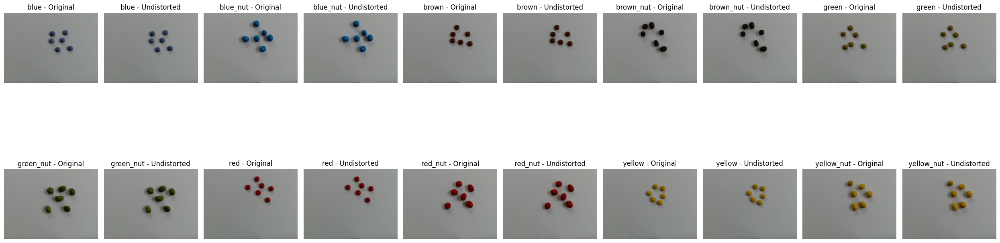

In [48]:
input_dir = '/content/drive/MyDrive/VC/white_isolated'
output_dir = '/content/drive/MyDrive/VC/white_isolated_undistorted'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

fig, axes = plt.subplots(2, 10, figsize=(25, 10))
axes = axes.ravel()

categories = ["blue", "blue_nut", "brown", "brown_nut", "green", "green_nut", "red", "red_nut", "yellow", "yellow_nut"]

for i, category in enumerate(categories):
    image_files = glob.glob(f'{input_dir}/{category}.png')

    if image_files:
        image = cv.imread(image_files[0])

        if image is None:
            print(f"Error loading {category}.")
            continue

        h, w = image.shape[:2]
        newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 0, (w, h))
        undistorted_img = cv.undistort(image, mtx, dist, None, newcameramtx)
        original_img_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        undistorted_img_rgb = cv.cvtColor(undistorted_img, cv.COLOR_BGR2RGB)
        axes[2 * i].imshow(original_img_rgb)
        axes[2 * i].set_title(f"{category} - Original")
        axes[2 * i].axis('off')
        axes[2 * i + 1].imshow(undistorted_img_rgb)
        axes[2 * i + 1].set_title(f"{category} - Undistorted")
        axes[2 * i + 1].axis('off')
        filename = os.path.basename(image_files[0])
        filename_without_extension = os.path.splitext(filename)[0]
        undistorted_image_path = os.path.join(output_dir, f'{filename_without_extension}_undistorted.png')
        cv.imwrite(undistorted_image_path, undistorted_img)

plt.tight_layout()
plt.show()

We see that, since there is not a huge distortion, the difference is minimum. However, we kept this step to keep the coherence and good practices.

# 3 a) Define a ROI (region of interest) for the image.

The Region of Interest of an image refers to the specific area within the image that is selected for further analysis,  typically defined by a rectangular bounding box within the image's pixel grid.

Using OpenCV it is defined by specifying the starting coordinates [x,y] and the width and height of the region in pixels.

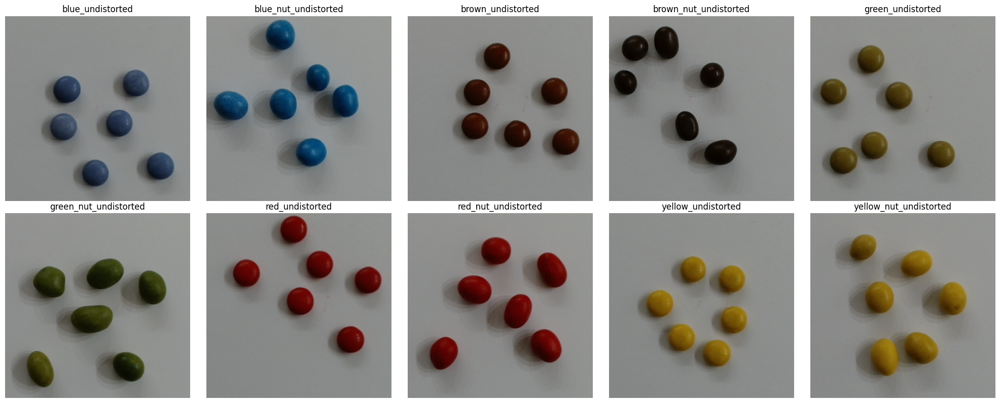

In [49]:
roi_normal = (250, 50, 240, 240)
roi_nut = (250, 50, 270, 270)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, category in enumerate(categories):
    x, y, w, h = roi_nut if "nut" in category else roi_normal

    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])

        # Define the ROI
        roi = image[y:y+h, x:x+w]
        roi_rgb = cv.cvtColor(roi, cv.COLOR_BGR2RGB)

        axes[i].imshow(roi_rgb)
        axes[i].set_title(category + '_undistorted')
        axes[i].axis('off')

plt.tight_layout()
plt.show()

# 3 b)  Show a histogram for each image of M&Ms considering HSV.

The histograms for Hue, Saturation, and Value are calculated and visualized to show how the pixel values of each channel are distributed within the region of interest (ROI) of the image.

Even though **Hue** is an **angle**, the histograms are calculated by counting the frequency of occurrence of each hue value (0-179 degrees [not 360]) in the image. This is why it can be plotted as a standard histogram, with the x-axis representing the hue values (ranging from 0 to 179) and the y-axis representing the frequency (or normalized occurrence) of those hue values in the image.


For **Saturation** and **Value**, the range is from 0 to 255 and the logic is the same as the Hue case.


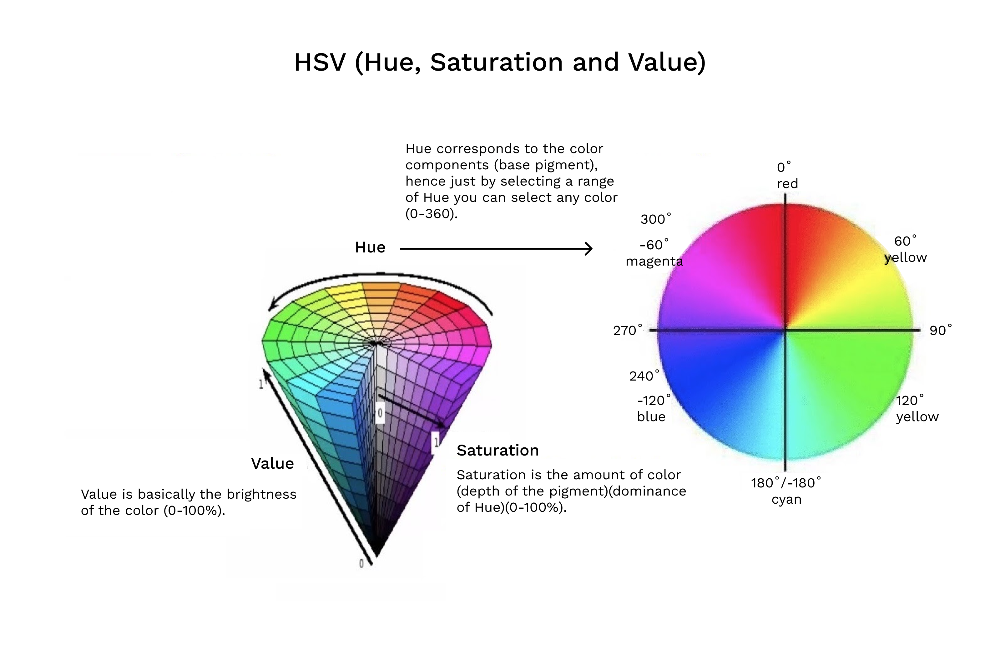

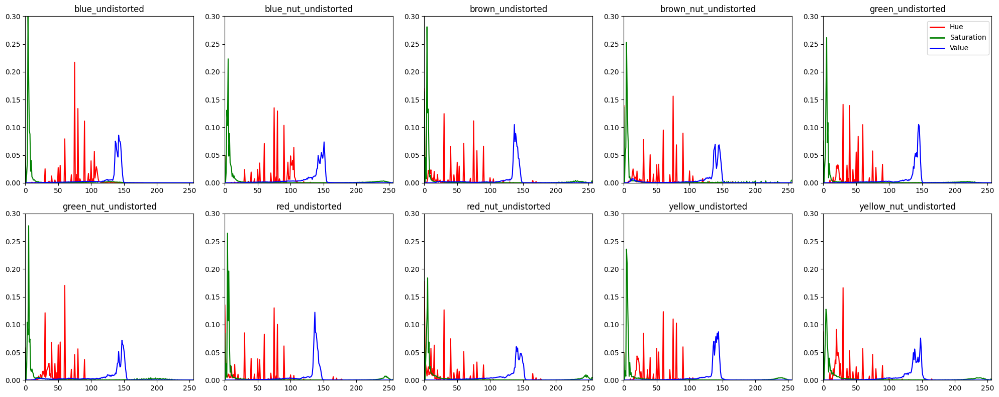

In [50]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, category in enumerate(categories):
    x, y, w, h = roi_nut if "nut" in category else roi_normal

    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])

        roi = image[y:y+h, x:x+w]

        roi_hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)  # Convert to HSV

        # Calculate histograms for each channel (Hue, Saturation, Value)
        h_hist = cv.calcHist([roi_hsv], [0], None, [180], [0, 179])  # Hue (0-179)
        s_hist = cv.calcHist([roi_hsv], [1], None, [256], [0, 256])  # Saturation (0-255)
        v_hist = cv.calcHist([roi_hsv], [2], None, [256], [0, 256])  # Value (0-255)

        # Normalize the histograms
        h_hist = h_hist / h_hist.sum()
        s_hist = s_hist / s_hist.sum()
        v_hist = v_hist / v_hist.sum()

        axes[i].plot(h_hist, color='r', label='Hue')
        axes[i].plot(s_hist, color='g', label='Saturation')
        axes[i].plot(v_hist, color='b', label='Value')
        axes[i].set_xlim([0, 256])
        axes[i].set_ylim(0, 0.3)
        axes[i].set_title(category + '_undistorted')
        axes[i].axis('on')

handles = [plt.Line2D([0], [0], color='r', lw=2, label='Hue'),
           plt.Line2D([0], [0], color='g', lw=2, label='Saturation'),
           plt.Line2D([0], [0], color='b', lw=2, label='Value')]

fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.99, 0.95))

plt.tight_layout()
plt.show()


These plots are for the undistorted images, that are very similar to the distorted original ones. The comparison is presented in Attachment 1*.

HSV uses a triplet of channels, where **hue** is the color's tone, **saturation** is its intensity, and **value** represents its brightness.

 * The prominent peak on the left for the low **saturation** values  (green lines) are primarily due to the **white background** present in all the images, meaning that there are a lot of white pixels in our images (white is a color with zero saturation).  We observed that in images like red_nut or yellow_nut, where the M&Ms occupy a larger portion of the image and there is less white background. In these situations, the saturation peak becomes less pronounced.

 * The Hue values have prominent peaks between 0 and 100, with some concentrated spikes around certain values, with a quite similar pattern across all the images because, despite the different colors of the M&Ms. Each image contains a dominant area of a single color. Lower hue values (around 0-20) correspond to red and brown hues (indeed, red plots have lower Hue values in the plot above), and mid-range hue values (60-120) could correspond to yellows or greens.

 * Regarding **Value**', the brightness is similar in all cases and all histograms share a similar range of values. For brighter and lighter colors such as yellow, green, and blue, the peak is located further to the right.

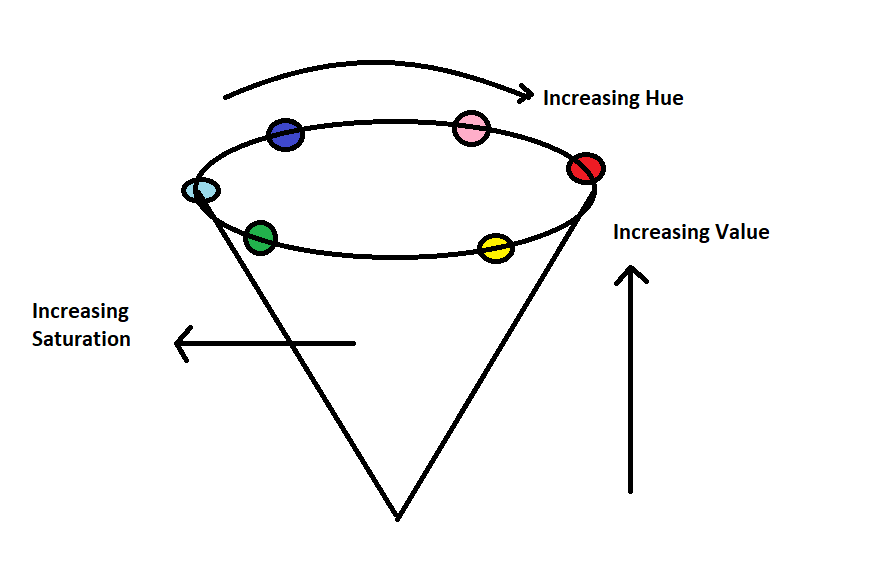

# 3 c)  Determine the average area for the M&Ms in pixels. Show the M&Ms detections.

Building on the previous concept of converting images to the HSV color space, let's now visualize the images using this color model:

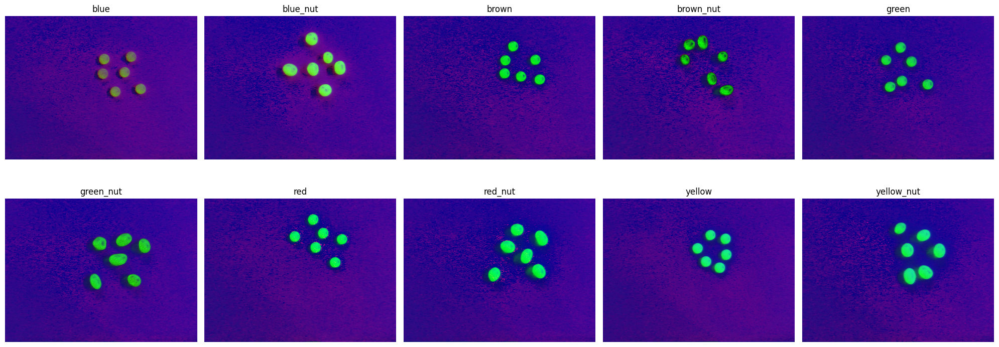

In [51]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

for i, category in enumerate(categories):
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])

        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV) # Convert to HSV

        axes[i].imshow(hsv)
        axes[i].set_title(category)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

Let's explore whether defining thresholds in the HSV scale, based on the recent findings, can simplify the detection of the M&M's area in the images.

This output of the various images in the HSV space provides insight into which images are interpreted **similarly and which are more distinct**.

 * For instance, the blue image stands out as being noticeably different from the others.

 * The brown_nut image also appears somewhat different. In contrast, the red, red_nut, yellow_nut, and brown images are very similar to each other, which may later suggest that their HSV ranges overlap.

 * Additionally, the green_nut and brown_nut images seem to share similarities as well.

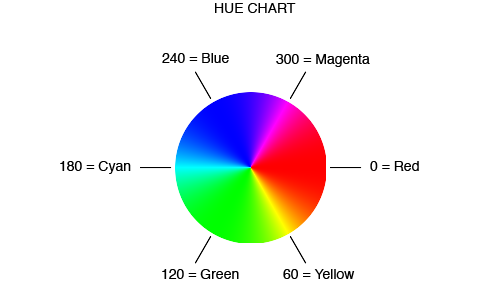

Let's try to filter the blue color based on Hue, by creating a binary mask (mask_hue) that highlights the pixels with a Hue value between 105 and 120. These Hue values correspond to the blue color range in the HSV color space (between 105x2=210 and 120x2=240 in the image above).

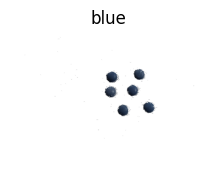

In [52]:
blue_categories = [category for category in categories if category.endswith("blue")]
fig, ax = plt.subplots(1, 1, figsize=(4, 2))
for i, category in enumerate(blue_categories):
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])
        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
        mask_hue = (hsv[:, :, 0] > 105) & (hsv[:, :, 0] < 120)
        white_background = np.ones_like(image) * 255
        masked_image = np.where(mask_hue[..., np.newaxis], image, white_background)
        masked_image_rgb = cv.cvtColor(masked_image, cv.COLOR_BGR2RGB)
        ax.imshow(masked_image_rgb)
        ax.set_title(category)
        ax.axis('off')
plt.tight_layout()
plt.show()

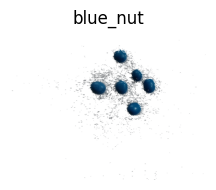

In [53]:
blue_categories = [category for category in categories if category.endswith("blue_nut")]
fig, ax = plt.subplots(1, 1, figsize=(4, 2))
for i, category in enumerate(blue_categories):
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])
        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
        mask_hue = (hsv[:, :, 0] > 100) & (hsv[:, :, 0] < 110)
        white_background = np.ones_like(image) * 255  #Decrease a litle bit the thr for the 'nut' version
        masked_image = np.where(mask_hue[..., np.newaxis], image, white_background)
        masked_image_rgb = cv.cvtColor(masked_image, cv.COLOR_BGR2RGB)
        ax.imshow(masked_image_rgb)
        ax.set_title(category)
        ax.axis('off')
plt.tight_layout()
plt.show()

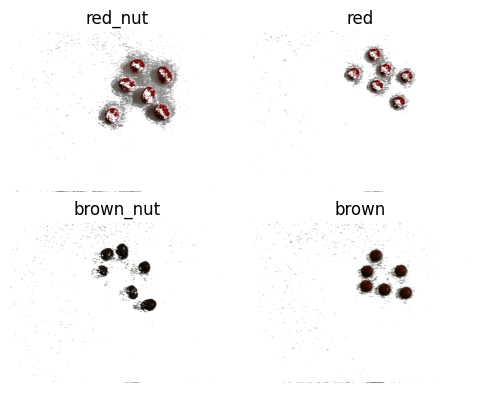

In [54]:
red_categories = [ "red_nut", "red", "brown_nut", "brown"]
fig, axes = plt.subplots(2, 2, figsize=(5, 4))
axes = axes.ravel()

for i, category in enumerate(red_categories):
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])
        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
        mask_hue = ((hsv[:, :, 0] > 0) & (hsv[:, :, 0] < 20))
        white_background = np.ones_like(image) * 255
        masked_image = np.where(mask_hue[..., np.newaxis], image, white_background)
        masked_image_rgb = cv.cvtColor(masked_image, cv.COLOR_BGR2RGB)
        axes[i].imshow(masked_image_rgb)
        axes[i].set_title(category)
        axes[i].axis('off')
plt.tight_layout()
plt.show()

This strategy proves to be quite effective, but the presence of noise presents a challenge. Let's attempt to filter out the noise by utilizing the Saturation channel, which may be more well-defined for this purpose:

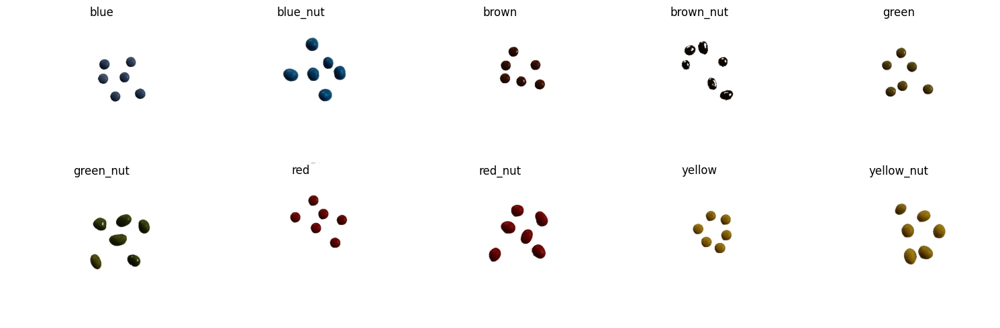

In [55]:
fig, axes = plt.subplots(2, 5, figsize=(15, 5))
axes = axes.ravel()

for i, category in enumerate(categories):
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])

        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

        # Set different saturation thresholds for blue and other categories
        if category == "blue" or category == "blue_nut":
            high_saturation_threshold = 60  # Lower threshold for blue category
        else:
            high_saturation_threshold = 125

        mask_saturation = hsv[:, :, 1] > high_saturation_threshold
        white_background = np.ones_like(image) * 255
        masked_image = np.where(mask_saturation[..., np.newaxis], image, white_background)
        masked_image_rgb = cv.cvtColor(masked_image, cv.COLOR_BGR2RGB)
        axes[i].imshow(masked_image_rgb)
        axes[i].set_title(category)
        axes[i].axis('off')
plt.tight_layout()
plt.show()

Let's just visualize the effect of changing the saturation threshold:

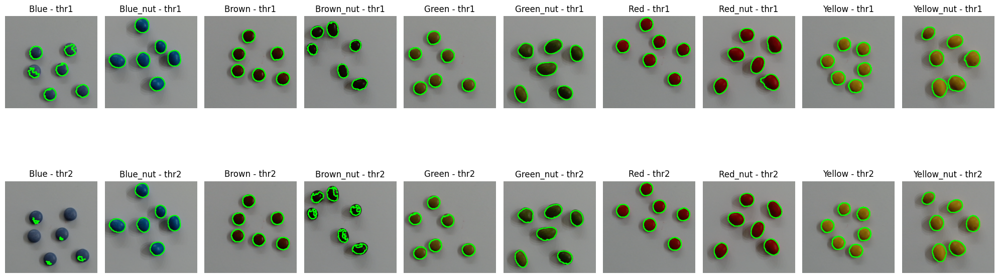

Average area of M&Ms with Saturation threshold 100: 1109.78 pixels
Average area of M&Ms with Saturation threshold 150: 892.70 pixels


In [56]:
thr1 = 100
thr2 = 150

areas_thr1 = []
areas_thr2 = []

fig, axes = plt.subplots(2, len(categories), figsize=(20, 8))
axes = axes.ravel()

for i, category in enumerate(categories):
    x, y, w, h = roi_nut if "nut" in category else roi_normal
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
    if image_files:
        image = cv.imread(image_files[0])
        roi = image[y:y+h, x:x+w]
        hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)
        mask_thr1 = hsv[:, :, 1] > thr1
        mask_thr2 = hsv[:, :, 1] > thr2

        contours_thr1, _ = cv.findContours(mask_thr1.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        contours_thr2, _ = cv.findContours(mask_thr2.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

        roi_with_contours_thr1 = roi.copy()
        roi_with_contours_thr2 = roi.copy()

        for contour in contours_thr1:
            area = cv.contourArea(contour)
            if area > 0:
                areas_thr1.append(area)
                cv.drawContours(roi_with_contours_thr1, [contour], -1, (0, 255, 0), 2)

        for contour in contours_thr2:
            area = cv.contourArea(contour)
            if area > 0:
                areas_thr2.append(area)
                cv.drawContours(roi_with_contours_thr2, [contour], -1, (0, 255, 0), 2)

        roi_with_contours_thr1_rgb = cv.cvtColor(roi_with_contours_thr1, cv.COLOR_BGR2RGB)
        roi_with_contours_thr2_rgb = cv.cvtColor(roi_with_contours_thr2, cv.COLOR_BGR2RGB)

        axes[i].imshow(roi_with_contours_thr1_rgb)
        axes[i].set_title(f'{category.capitalize()} - thr1')
        axes[i].axis('off')

        axes[i + len(categories)].imshow(roi_with_contours_thr2_rgb)
        axes[i + len(categories)].set_title(f'{category.capitalize()} - thr2')
        axes[i + len(categories)].axis('off')

plt.tight_layout()
plt.show()
average_area_thr1 = sum(areas_thr1) / len(areas_thr1) if areas_thr1 else 0
average_area_thr2 = sum(areas_thr2) / len(areas_thr2) if areas_thr2 else 0

print(f'Average area of M&Ms with Saturation threshold {thr1}: {average_area_thr1:.2f} pixels')
print(f'Average area of M&Ms with Saturation threshold {thr2}: {average_area_thr2:.2f} pixels')


When we increase the saturation threshold, we’re essentially filtering out more pixels that don’t meet the higher saturation requirement. This means that only the most saturated parts of the M&Ms are detected, while the less saturated areas—which may include edges or gradients around the M&M’s shape—are excluded.

As a result, the contours no longer capture the full shape, as they lose the less saturated pixels along the edges. They become less accurate, often missing parts of the M&M’s outline and capturing a smaller, more “core” region of the object.

Since only a portion of the M&M is now captured, the total area appears smaller, resulting in a lower average area calculation.


**3 d)  Determine the average area and standard deviation for each M&Ms type (with or without peanut) and color in millimeters. Show the result in a table type vs color vs area and standard deviation.**

In [57]:
default_saturation_threshold = 100
blue_saturation_threshold = 60
pixel_to_mm = 0.2214

area_data = {
    "Color": [],
    "Plain_Area_mm2": [],
    "Plain_Std_mm2": [],
    "Peanut_Area_mm2": [],
    "Peanut_Std_mm2": []}
color_mapping = {
    "blue": "Blue",
    "brown": "Brown",
    "green": "Green",
    "red": "Red",
    "yellow": "Yellow"
}
processed_colors = {color: {"Plain": False, "Peanut": False} for color in color_mapping.values()}

for category in categories:
    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')

    if image_files:
        image = cv.imread(image_files[0])
        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

        if category == "blue" or category == "blue_nut":
            high_saturation_threshold = blue_saturation_threshold
        else:
            high_saturation_threshold = default_saturation_threshold

        mask = hsv[:, :, 1] > high_saturation_threshold
        contours, _ = cv.findContours(mask.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

        areas = []
        for contour in contours:
            area = cv.contourArea(contour)
            if area > 0:
                areas.append(area * (pixel_to_mm ** 2))

        color = color_mapping[category.split('_')[0]]

        if 'nut' in category:
            if areas:
                avg_area = np.mean(areas)
                std_area = np.std(areas)
                area_data["Peanut_Area_mm2"].append(avg_area)
                area_data["Peanut_Std_mm2"].append(std_area)
            else:
                area_data["Peanut_Area_mm2"].append(None)
                area_data["Peanut_Std_mm2"].append(None)

            processed_colors[color]["Peanut"] = True
        else:
            if areas:
                avg_area = np.mean(areas)
                std_area = np.std(areas)
                area_data["Plain_Area_mm2"].append(avg_area)
                area_data["Plain_Std_mm2"].append(std_area)
            else:
                area_data["Plain_Area_mm2"].append(None)
                area_data["Plain_Std_mm2"].append(None)

            processed_colors[color]["Plain"] = True

for color in processed_colors:
    area_data["Color"].append(color)
    if not processed_colors[color]["Plain"]:
        area_data["Plain_Area_mm2"].append(None)
        area_data["Plain_Std_mm2"].append(None)
    if not processed_colors[color]["Peanut"]:
        area_data["Peanut_Area_mm2"].append(None)
        area_data["Peanut_Std_mm2"].append(None)

df = pd.DataFrame(area_data)
mean_plain_area = df["Plain_Area_mm2"].mean()
mean_plain_std = df["Plain_Std_mm2"].mean()
mean_peanut_area = df["Peanut_Area_mm2"].mean()
mean_peanut_std = df["Peanut_Std_mm2"].mean()

df.loc[len(df)] = ["Mean", mean_plain_area, mean_plain_std, mean_peanut_area, mean_peanut_std]
df["Color_Mean_Area_mm2"] = df[["Plain_Area_mm2", "Peanut_Area_mm2"]].mean(axis=1, skipna=True)
df[["Plain_Area_mm2", "Plain_Std_mm2", "Peanut_Area_mm2", "Peanut_Std_mm2", "Color_Mean_Area_mm2"]] = df[[
    "Plain_Area_mm2", "Plain_Std_mm2", "Peanut_Area_mm2", "Peanut_Std_mm2", "Color_Mean_Area_mm2"
]].round(1)
print(tabulate(df, headers='keys', tablefmt='pretty', showindex=False))

+--------+----------------+---------------+-----------------+----------------+---------------------+
| Color  | Plain_Area_mm2 | Plain_Std_mm2 | Peanut_Area_mm2 | Peanut_Std_mm2 | Color_Mean_Area_mm2 |
+--------+----------------+---------------+-----------------+----------------+---------------------+
|  Blue  |      43.0      |      1.3      |      70.0       |      8.3       |        56.5         |
| Brown  |      42.4      |      0.5      |      47.0       |      8.1       |        44.7         |
| Green  |      43.8      |      1.7      |      75.9       |      8.4       |        59.9         |
|  Red   |      46.2      |      0.7      |      76.6       |      7.0       |        61.4         |
| Yellow |      47.4      |      1.7      |      76.1       |      12.6      |        61.8         |
|  Mean  |      44.6      |      1.2      |      69.1       |      8.9       |        56.8         |
+--------+----------------+---------------+-----------------+----------------+-------------

'Plain' M&Ms have all very similar values, as we anticipated the same results across M&Ms of the same type. As expected, 'Peanut' M&Ms have larger average areas compared to 'Plain' ones.

Regarding standard deviation, it makes sense that the 'Peanut' M&Ms show a higher standard deviation than the 'Plain' ones, as their shapes are slightly different within the same color. We observe that the 'Plain' M&Ms are, indeed, all very consistent in size.

# **4 ) Consider only the images with the mixed M&Ms retrieved from a white background. Implement the functions described below:**




4 a) Calculate the number of M&M per color and type for all images provided.


Let's do it for the first image. The first thing to do is undistord the image.

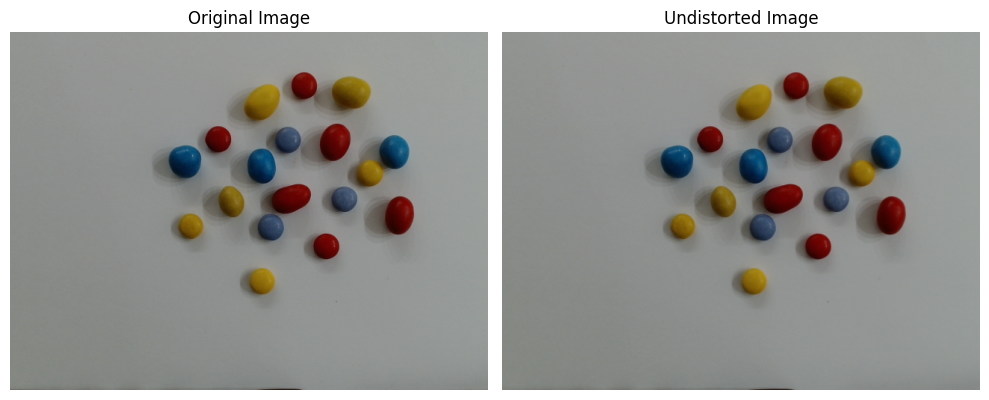

In [58]:
image = cv.imread('/content/drive/MyDrive/VC/white_mix/blue_yellow_red.png')
h, w = image.shape[:2]
newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 0, (w, h))

# Undistort the image
undistorted_img_blue_yellow_red = cv.undistort(image, mtx, dist, None, newcameramtx)

original_img_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
undistorted_img_rgb = cv.cvtColor(undistorted_img_blue_yellow_red, cv.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(original_img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(undistorted_img_rgb)
axes[1].set_title('Undistorted Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()


Secondly we'll acess if any of the following filters is usefull.

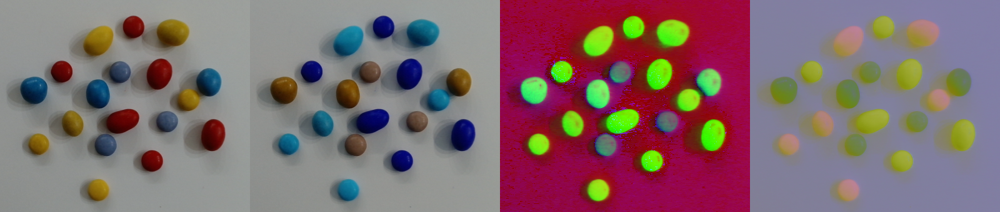

In [59]:
x, y, w, h = 180, 30, 400, 340
roi = undistorted_img_blue_yellow_red[y:y+h, x:x+w]

roi_bgr = cv.cvtColor(roi, cv.COLOR_RGB2BGR)
roi_hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)
roi_lab = cv.cvtColor(roi, cv.COLOR_BGR2Lab)

side_by_side = np.hstack((roi, roi_bgr, roi_hsv, roi_lab))
cv2_imshow(side_by_side)

None of them seems particularly useful so we will perform the analysis in the initial raw image:

In [60]:
def count_objects_by_color(image, color_ranges, min_radius=10):
    hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    color_mask = 0
    for low, high in color_ranges:
        color_mask += cv.inRange(hsv_image, low, high)
    contours, _ = cv.findContours(color_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    circles = []
    for cnt in contours:
        (x, y), radius = cv.minEnclosingCircle(cnt)
        center = (int(x), int(y))
        radius = int(radius)
        if radius < min_radius:
            continue
        circles.append([center, radius])
    return len(circles), circles

def separate_and_count(image, color_ranges, min_radius=10):
    counts = {'Peanut': {}, 'Plain': {}}
    peanut_circles = []
    plain_circles = []
    for color in color_ranges:
        count, circles = count_objects_by_color(image, color['ranges'], min_radius)
        color_name = color['name']
        for circle in circles:
            if circle[1] > 18:
                counts['Peanut'][color_name] = counts['Peanut'].get(color_name, 0) + 1
                peanut_circles.append((circle, color_name))
            else:
                counts['Plain'][color_name] = counts['Plain'].get(color_name, 0) + 1
                plain_circles.append((circle, color_name))
    return counts, peanut_circles, plain_circles

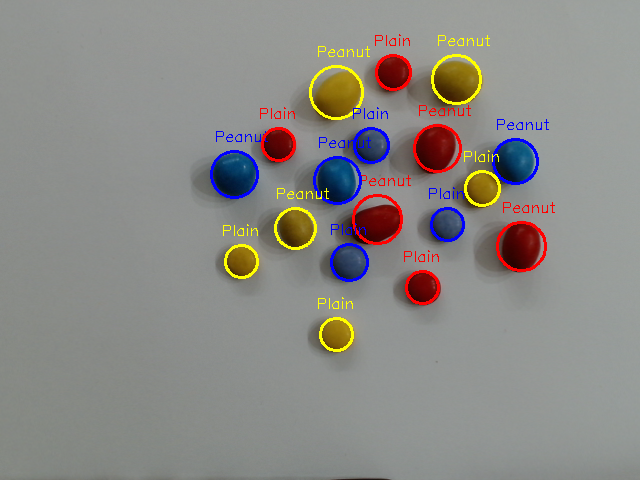

Counts for blue_yellow_red.jpg: {'Peanut': {'Red': 3, 'Blue': 3, 'Yellow': 3}, 'Plain': {'Red': 3, 'Blue': 3, 'Yellow': 3}}


In [61]:

color_definitions = [
    {'name': 'Red', 'ranges': [[np.array([0, 170, 60]), np.array([10, 255, 255])],
                               [np.array([170, 170, 60]), np.array([180, 255, 255])]]},
    {'name': 'Blue', 'ranges': [[np.array([100, 50, 50]), np.array([140, 255, 255])]]},
    {'name': 'Yellow', 'ranges': [[np.array([20, 170, 60]), np.array([35, 255, 255])]]},
]

color_bgr = {
    'Red': (0, 0, 255),
    'Blue': (255, 0, 0),
    'Yellow': (0, 255, 255)
}

min_radius = 10
color_counts_img1, peanut_circles, plain_circles = separate_and_count(undistorted_img_blue_yellow_red, color_definitions, min_radius)

im = undistorted_img_blue_yellow_red.copy()

for (center, radius), color_name in peanut_circles:
    if color_name in color_bgr:
        color = color_bgr[color_name]
    else:
        continue
    cv.circle(im, center, radius, color, 2)
    cv.putText(im, 'Peanut', (center[0] - 20, center[1] - radius - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

for (center, radius), color_name in plain_circles:
    if color_name in color_bgr:
        color = color_bgr[color_name]
    else:
        continue
    cv.circle(im, center, radius, color, 2)
    cv.putText(im, 'Plain', (center[0] - 20, center[1] - radius - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

cv2_imshow(im)
print(f"Counts for blue_yellow_red.jpg: {color_counts_img1}")


Now on to the second image! Undistortion is the first step.

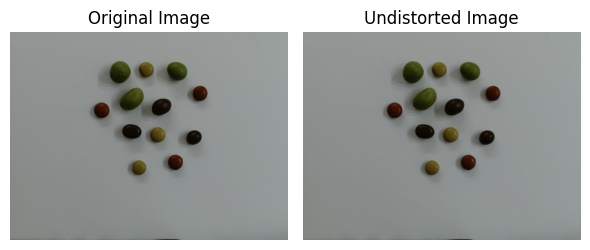

In [62]:
image = cv.imread('/content/drive/MyDrive/VC/white_mix/green_brown.png')

h, w = image.shape[:2]
newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 0, (w, h))
undistorted_img_green_brown = cv.undistort(image, mtx, dist, None, newcameramtx)
original_img_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
undistorted_img_rgb = cv.cvtColor(undistorted_img_green_brown, cv.COLOR_BGR2RGB)
fig, axes = plt.subplots(1, 2, figsize=(6, 3))
axes[0].imshow(original_img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(undistorted_img_rgb)
axes[1].set_title('Undistorted Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()

For the second image, which contains only brown and green M&Ms, we found it necessary to use more than just the radius of the enclosing circle to determine the type, as some M&Ms have a more oval shape.

 Therefore, we considered the **ratio between the width and height** of a rectangular bounding box drawn around each M&M. This way, the **closer the ratio is to 1**, the rounder the M&M is, and the less likely it is to be of the peanut type:

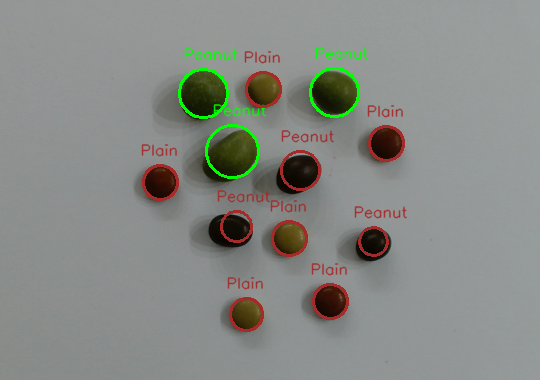

Counts for green_brown.jpg: {'Peanut': {'Green': 3, 'Brown': 3}, 'Plain': {'Brown': 6}}


In [63]:
def count_objects_by_color(image, color_ranges, min_radius=8):
    hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    color_mask = 0
    for low, high in color_ranges:
        color_mask += cv.inRange(hsv_image, low, high)
    contours, _ = cv.findContours(color_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    circles = []
    for cnt in contours:
        (x, y), radius = cv.minEnclosingCircle(cnt)
        center = (int(x), int(y))
        radius = int(radius)
        if radius < min_radius:
            continue
        circles.append([center, radius, cnt])
    return len(circles), circles

def separate_and_count(image, color_ranges_dict, min_radius=8):
    counts = {'Peanut': {}, 'Plain': {}}
    peanut_circles = []
    plain_circles = []
    annotated_image = image.copy()

    color_bgr = {
        'Green': (0, 255, 0),
        'Brown': (42, 42, 165)  # Dark brown BGR value
    }

    for color_name, color_ranges in color_ranges_dict.items():
        count, circles = count_objects_by_color(image, color_ranges, min_radius)

        for circle in circles:
            center, radius, cnt = circle

            x, y, w, h = cv.boundingRect(cnt)
            aspect_ratio = float(w) / h if h != 0 else 0

            if (radius > 12 and aspect_ratio > 1.18) or radius > 20:
                counts['Peanut'][color_name] = counts['Peanut'].get(color_name, 0) + 1
                peanut_circles.append(circle)
            else:
                counts['Plain'][color_name] = counts['Plain'].get(color_name, 0) + 1
                plain_circles.append(circle)

            if color_name in color_bgr:
                color = color_bgr[color_name]
                cv.circle(annotated_image, center, radius, color, 2)

                label = 'Peanut' if (radius > 12 and aspect_ratio > 1.18) or radius > 20 else 'Plain'
                cv.putText(annotated_image, label, (center[0] - 20, center[1] - radius - 10),
                           cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv.LINE_AA)

    cv2_imshow(annotated_image)
    return counts, peanut_circles, plain_circles

color_ranges_dict = {
    'Green': [[np.array([30, 50, 50]), np.array([90, 255, 255])]],
    'Brown': [
        [np.array([5, 100, 20]), np.array([25, 255, 255])],

    ]
}

x, y, w, h = 50, 0, 540, 380
roi = undistorted_img_green_brown[y:y+h, x:x+w]

color_counts_img2, peanut_circles, plain_circles = separate_and_count(roi, color_ranges_dict)

print(f"Counts for green_brown.jpg: {color_counts_img2}")


We recognize that some M&Ms have non obvious colors, however, for us these values were tuned so that these results are the truth.

Now let's use all of these color to detect the M&Ms all mixed in the same photo, still considering the ratio between the width and height of a rectangular bounding box drawn around each M&M:

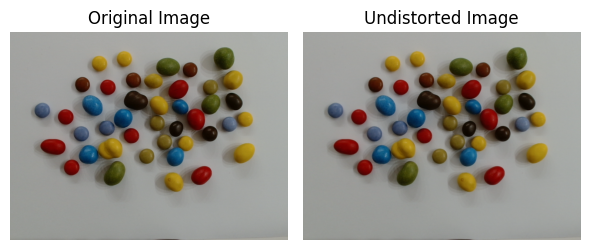

In [64]:
image = cv.imread('/content/drive/MyDrive/VC/white_mix/all_rand.png')

h, w = image.shape[:2]
newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 0, (w, h))
undistorted_img_all_rand = cv.undistort(image, mtx, dist, None, newcameramtx)
original_img_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
undistorted_img_rgb = cv.cvtColor(undistorted_img_all_rand, cv.COLOR_BGR2RGB)
fig, axes = plt.subplots(1, 2, figsize=(6, 3))

axes[0].imshow(original_img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(undistorted_img_rgb)
axes[1].set_title('Undistorted Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

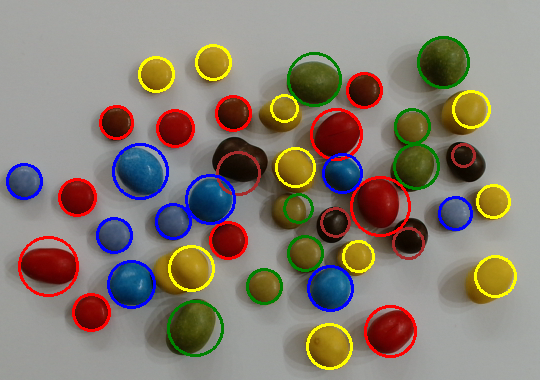

Counts for all_rand.jpg: {'Peanut': {'Green': 4, 'Brown': 2, 'Red': 4, 'Blue': 5, 'Yellow': 7}, 'Plain': {'Green': 4, 'Brown': 2, 'Red': 7, 'Blue': 4, 'Yellow': 3}}


In [65]:
def separate_and_count_multi_color(image, color_ranges_dict, min_radius=10):
    counts = {'Peanut': {}, 'Plain': {}}
    peanut_circles = []
    plain_circles = []
    annotated_image = image.copy()

    for color_name, color_ranges in color_ranges_dict.items():
        count, circles = count_objects_by_color(image, color_ranges, min_radius)

        for circle in circles:
            center, radius, cnt = circle

            # Calculate aspect ratio
            x, y, w, h = cv.boundingRect(cnt)
            aspect_ratio = float(w) / h if h != 0 else 0

            # Convert color name to BGR format for drawing (regardless of color)
            color = webcolors.name_to_rgb(color_name)
            color_bgr = (color[2], color[1], color[0])

            # Draw a circle around the detected object
            cv.circle(annotated_image, center, radius, color_bgr, 2)

            # Classify as Peanut or Plain and update counts
            if radius > 18 or aspect_ratio > 1.32 or (aspect_ratio < 0.85 and radius > 15):
                counts['Peanut'][color_name] = counts['Peanut'].get(color_name, 0) + 1
                peanut_circles.append(circle)
            else:
                counts['Plain'][color_name] = counts['Plain'].get(color_name, 0) + 1
                plain_circles.append(circle)

    cv2_imshow(annotated_image)
    return counts, peanut_circles, plain_circles

# Define color ranges
color_ranges_dict = {
    'Green': [
              [np.array([30, 50, 50]), np.array([90, 255, 255])],
              [np.array([40, 50, 50]), np.array([70, 200, 200])],
              [np.array([20, 130, 10]), np.array([25, 190, 140])]
    ],

    'Brown': [
        [np.array([10, 100, 10]), np.array([20, 180, 40])]
    ],
    'Red': [[np.array([0, 100, 20]), np.array([10, 255, 255])]],
    'Blue': [[np.array([100, 50, 50]), np.array([140, 255, 255])]],
    'Yellow': [[np.array([20, 150, 150]), np.array([30, 255, 255])]]
}

# Define region of interest (ROI)
x, y, w, h = 50, 0, 540, 380
roi = image[y:y+h, x:x+w]

# Run the function and display counts
color_counts_img3, peanut_circles, plain_circles = separate_and_count_multi_color(roi, color_ranges_dict)
print(f"Counts for all_rand.jpg: {color_counts_img3}")



4 b) Show the M&Ms detections and centroids.


Lets start with the first image undistorted.

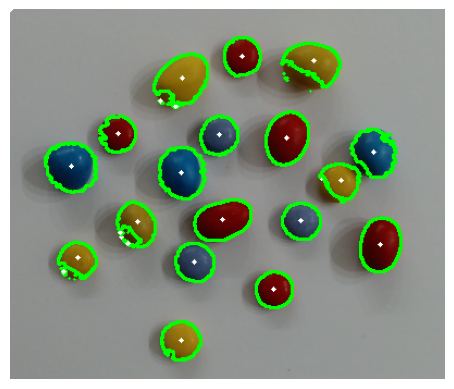

In [66]:
img_bgr = undistorted_img_blue_yellow_red

x, y, w, h = 180, 30, 400, 340
img_bgr = img_bgr[y:y+h, x:x+w]

img_hsv = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

color_ranges = [
    {'name': 'Red', 'ranges': [(0, 130, 20), (10, 255, 255)]},
    {'name': 'Blue', 'ranges': [(100, 30, 20), (140, 255, 255)]},
    {'name': 'Yellow',
     'ranges': [(20, 100, 100), (35, 255, 255)],
     'alt_ranges': [(20, 80, 50), (35, 255, 180)]
    }]

for color in color_ranges:
    mask = cv.inRange(img_hsv, color['ranges'][0], color['ranges'][1])
    if 'alt_ranges' in color:
        alt_mask = cv.inRange(img_hsv, color['alt_ranges'][0], color['alt_ranges'][1])
        mask = cv.bitwise_or(mask, alt_mask)

    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        M = cv.moments(cnt)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            cX, cY = 0, 0

        cv.drawContours(img_bgr, [cnt], -1, (0, 255, 0), 2)
        cv.circle(img_bgr, (cX, cY), 2, (255, 255, 255), -1)

plt.imshow(cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB))
plt.title("")
plt.axis("off")
plt.show()



Defining the contorns using the saturation threshold gives us better results.

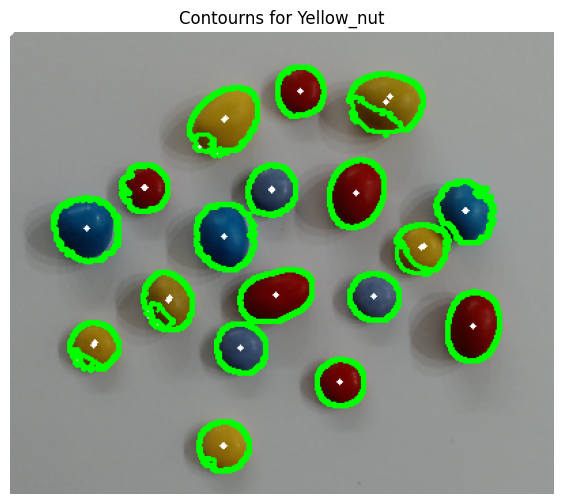

In [67]:
img_bgr = undistorted_img_blue_yellow_red

x, y, w, h = 180, 30, 400, 340
img_bgr = img_bgr[y:y+h, x:x+w]

hsv = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

mask_saturation = hsv[:, :, 1] > 150

contours, _ = cv.findContours(mask_saturation.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

image_with_contours = img_bgr.copy()

for contour in contours:
  cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
  M = cv.moments(contour)
  if M["m00"] != 0:
      cX = int(M["m10"] / M["m00"])
      cY = int(M["m01"] / M["m00"])
  else:
      cX, cY = 0, 0

  cv.circle(image_with_contours, (cX, cY), 2, (255, 255, 255), -1)

image_with_contours_rgb = cv.cvtColor(image_with_contours, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(image_with_contours_rgb)
plt.title(f'Contourns for {category.capitalize()}')
plt.axis('off')
plt.show()

Considering the saturation threshold for the second image:

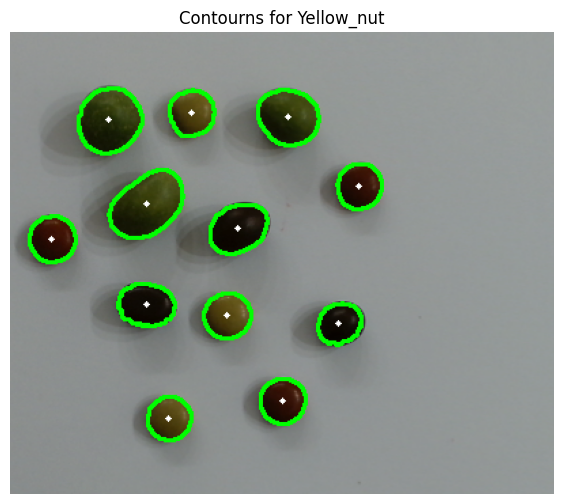

In [68]:
img_bgr = undistorted_img_green_brown

x, y, w, h = 180, 30, 400, 340
img_bgr = img_bgr[y:y+h, x:x+w]

hsv = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

mask_saturation = hsv[:, :, 1] > 90

contours, _ = cv.findContours(mask_saturation.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

image_with_contours = img_bgr.copy()

for contour in contours:
  cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
  M = cv.moments(contour)
  if M["m00"] != 0:
      cX = int(M["m10"] / M["m00"])
      cY = int(M["m01"] / M["m00"])
  else:
      cX, cY = 0, 0

  cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 1)
  cv.circle(image_with_contours, (cX, cY), 2, (255, 255, 255), -1)

image_with_contours_rgb = cv.cvtColor(image_with_contours, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(image_with_contours_rgb)
plt.title(f'Contourns for {category.capitalize()}')
plt.axis('off')
plt.show()


Finally, the same logic for the third image using the color ranges:



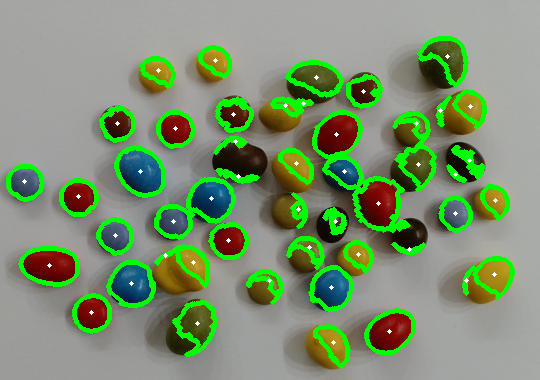

In [69]:
def separate_and_draw_contours_and_centroids(image, color_ranges_dict, min_radius=10):
    annotated_image = image.copy()

    for color_name, color_ranges in color_ranges_dict.items():
        # Chama a função que conta os objetos pela cor e retorna os contornos
        count, circles = count_objects_by_color(image, color_ranges, min_radius)

        for circle in circles:
            center, radius, cnt = circle

            # Calcular os momentos para encontrar o centro
            M = cv.moments(cnt)
            if M["m00"] != 0:
                cX = int(M["m10"] / M["m00"])
                cY = int(M["m01"] / M["m00"])
            else:
                cX, cY = 0, 0

            # Desenhar o contorno ao redor do objeto (espessura do contorno diminuída para 1)
            cv.drawContours(annotated_image, [cnt], -1, (0, 255, 0), 3)  # Contorno mais fino

            # Desenhar o centroide com cor branca
            cv.circle(annotated_image, (cX, cY), 2, (255, 255, 255), -1)  # Centroide branco

    cv2_imshow(annotated_image)  # Usar cv2_imshow no lugar de cv.imshow
    return annotated_image

# Define color ranges
color_ranges_dict = {
    'Green': [
        [np.array([30, 50, 50]), np.array([90, 255, 255])],
        [np.array([40, 50, 50]), np.array([70, 200, 200])],
        [np.array([20, 130, 10]), np.array([25, 190, 140])]
    ],

    'Brown': [
        [np.array([10, 100, 10]), np.array([20, 180, 40])]
    ],
    'Red': [[np.array([0, 100, 20]), np.array([10, 255, 255])]],
    'Blue': [[np.array([100, 50, 50]), np.array([140, 255, 255])]],
    'Yellow': [[np.array([20, 150, 150]), np.array([30, 255, 255])]]
}


image = undistorted_img_all_rand

# Definir a região de interesse (ROI)
x, y, w, h = 50, 0, 540, 380
roi = image[y:y+h, x:x+w]

# Chamar a função para desenhar os contornos e centroides
annotated_image = separate_and_draw_contours_and_centroids(roi, color_ranges_dict)


And now the saturation threshold:

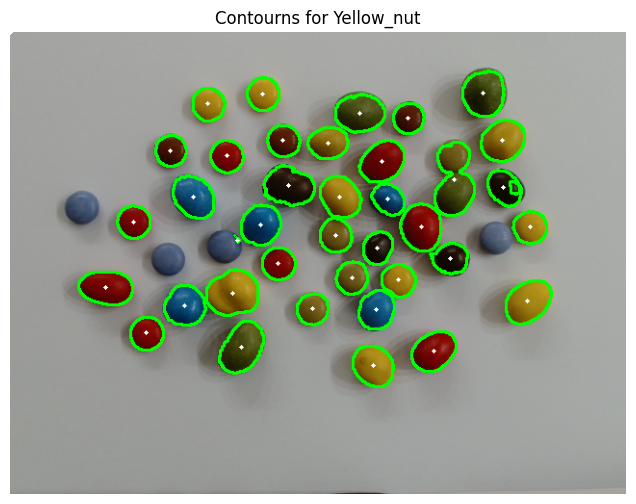

In [70]:
image = undistorted_img_all_rand

hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

mask_saturation = hsv[:, :, 1] > 150

contours, _ = cv.findContours(mask_saturation.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

image_with_contours = image.copy()

for contour in contours:
  cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
  M = cv.moments(contour)
  if M["m00"] != 0:
      cX = int(M["m10"] / M["m00"])
      cY = int(M["m01"] / M["m00"])
  else:
      cX, cY = 0, 0

  cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
  cv.circle(image_with_contours, (cX, cY), 2, (255, 255, 255), -1)

image_with_contours_rgb = cv.cvtColor(image_with_contours, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(image_with_contours_rgb)
plt.title(f'Contourns for {category.capitalize()}')
plt.axis('off')
plt.show()

4 c) Provide the table capturing the number of M&Ms type (with or without peanut) and color that are present in each image.

In [71]:
image_names = ["blue_yellow_red.jpg", "green_brown.jpg", "all_rand.jpg"]
data = []

for image_name, color_counts in zip(image_names, [color_counts_img1, color_counts_img2, color_counts_img3]):
    for type_, colors in color_counts.items():
        for color, count in colors.items():
            data.append({
                "Image": image_name,
                "Type": type_,
                "Color": color,
                "Count": count
            })

df = pd.DataFrame(data)
print(df)

                  Image    Type   Color  Count
0   blue_yellow_red.jpg  Peanut     Red      3
1   blue_yellow_red.jpg  Peanut    Blue      3
2   blue_yellow_red.jpg  Peanut  Yellow      3
3   blue_yellow_red.jpg   Plain     Red      3
4   blue_yellow_red.jpg   Plain    Blue      3
5   blue_yellow_red.jpg   Plain  Yellow      3
6       green_brown.jpg  Peanut   Green      3
7       green_brown.jpg  Peanut   Brown      3
8       green_brown.jpg   Plain   Brown      6
9          all_rand.jpg  Peanut   Green      4
10         all_rand.jpg  Peanut   Brown      2
11         all_rand.jpg  Peanut     Red      4
12         all_rand.jpg  Peanut    Blue      5
13         all_rand.jpg  Peanut  Yellow      7
14         all_rand.jpg   Plain   Green      4
15         all_rand.jpg   Plain   Brown      2
16         all_rand.jpg   Plain     Red      7
17         all_rand.jpg   Plain    Blue      4
18         all_rand.jpg   Plain  Yellow      3


4 d) Discuss the limitation of the method implemented (in 2 sentences).

The detection of M&Ms based on color ranges in the HSV color space is sensitive to variations in lighting and color shades, especially colors such as greenish brown or dark red that can be read as green and brown, respetivamente. Additionally, when M&Ms are overlapping or very close to each other, can be very difficult to segment, especially when the two M&M's are the same color.

4 e) Provide some recommendations that the M&M factory should take into consideration to improve the performance of the sorting process based on image processing (e.g., imaging setup, calibration process and photometric effects), in 4 sentences.



*   To improve the quality of the images captured, the factory could consider upgrading the lighting conditions, it should be diffuse and uniform, avoiding harsh shadows in order to contrast colors as best as possible;
*   Also, add a step in the M&M's flow where they are 'shaken' in order to not be as close to each other in the detection point. Meaning a separation system that uses vibrators or conveyor belts to keep the chocolates more spaced out;
*  Implementing a systematic calibration schedule, can also help maintain the accuracy of the system;
* At last, changing 'regularly' the color detection system with more recent models and new data might help to reduce the probability to error.

# 5 ) Consider the images retrieved from a brown background and repeat the previous points (4a, 4b, 4c)

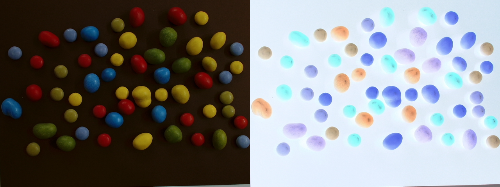

In [72]:
brown_image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')

negative_image = cv.bitwise_not(brown_image)

new_width = 250
aspect_ratio = new_width / brown_image.shape[1]
new_height = int(brown_image.shape[0] * aspect_ratio)

brown_image_resized = cv.resize(brown_image, (new_width, new_height))
negative_image_resized = cv.resize(negative_image, (new_width, new_height))

combined_image = np.hstack((brown_image_resized, negative_image_resized))
cv2_imshow(combined_image)

Since we have a dark background negative we had the idea of putting it negative to make the background lighter, as in the previous examples, but is not so promising or helpful. Let's try to **remove the background ** with a dark brown filter.

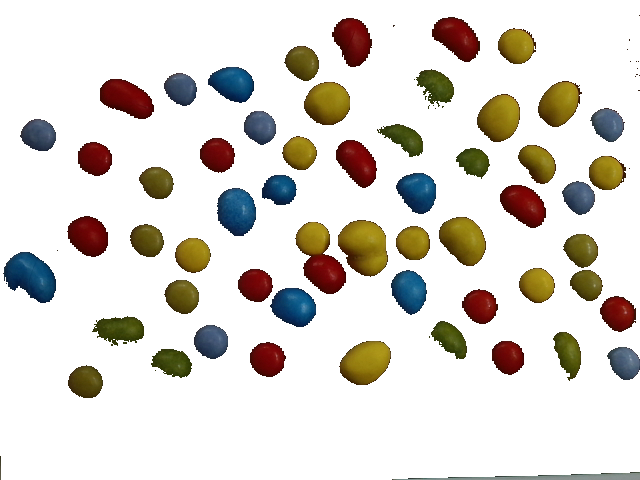

In [73]:
brown_image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')

hsv = cv.cvtColor(brown_image, cv.COLOR_BGR2HSV)

lower_dark = np.array([0, 0, 0])
upper_dark = np.array([180, 255, 50])
mask = cv.inRange(hsv, lower_dark, upper_dark)

white_background = np.full_like(brown_image, 255) # Initialize a white background

mms_on_white_background = np.where(mask[:, :, None] == 0, brown_image, white_background)
cv2_imshow(mms_on_white_background)

Given this new image, only with the M&Ms, we proceeded with the counting based on the color and type. In order to do that, we used the same ideas as in 4.a), incorporating the analysis of the ratio between the height and width.

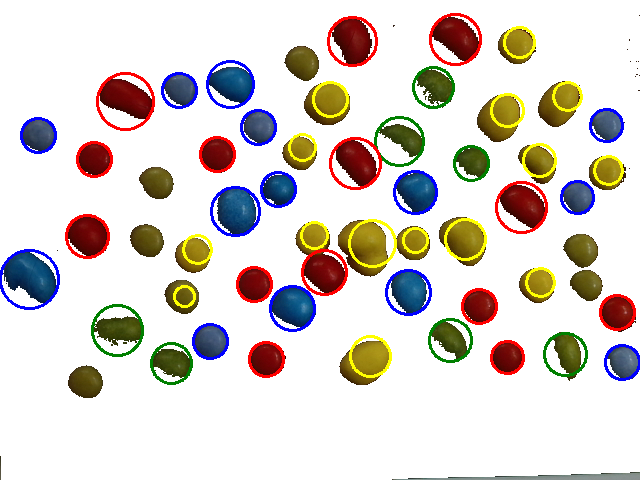

M&M Color Counts (Peanut vs Plain):
        Green  Red  Blue  Yellow
Peanut      6    7     6       3
Plain       1    7     8      12


In [74]:
def count_objects_by_color(image, color_ranges, min_radius=9):
    hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    color_mask = 0
    for low, high in color_ranges:
        color_mask += cv.inRange(hsv_image, low, high)
    contours, _ = cv.findContours(color_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    circles = []
    for cnt in contours:
        (x, y), radius = cv.minEnclosingCircle(cnt)
        center = (int(x), int(y))
        radius = int(radius)
        if radius < min_radius:
            continue
        circles.append([center, radius, cnt])
    return len(circles), circles

def separate_and_count_multi_color(image, color_ranges_dict, min_radius=10):
    counts = {'Peanut': {}, 'Plain': {}}
    peanut_circles = []
    plain_circles = []
    annotated_image = image.copy()

    for color_name, color_ranges in color_ranges_dict.items():
        count, circles = count_objects_by_color(image, color_ranges, min_radius)

        for circle in circles:
            center, radius, cnt = circle
            x, y, w, h = cv.boundingRect(cnt)
            aspect_ratio = float(w) / h if h != 0 else 0

            # Classify based on aspect ratio and radius
            if radius > 17 and aspect_ratio < 1.8:  # Peanut-like M&Ms
                counts['Peanut'][color_name] = counts['Peanut'].get(color_name, 0) + 1
                peanut_circles.append(circle)
            else:  # Plain M&Ms
                counts['Plain'][color_name] = counts['Plain'].get(color_name, 0) + 1
                plain_circles.append(circle)

            # Draw circles on the annotated image
            cv.circle(annotated_image, center, radius, webcolors.name_to_rgb(color_name)[::-1], 2)
            # Optionally, you can add the aspect ratio and radius as text:
            # cv.putText(annotated_image, f"AR: {aspect_ratio:.2f}, R: {radius}",
            #           (center[0] - 40, center[1] - 10), cv.FONT_HERSHEY_SIMPLEX,
            #          0.5, (0, 255, 0), 1, cv.LINE_AA)

    cv2_imshow(annotated_image)
    return counts, peanut_circles, plain_circles

color_ranges_dict = {
    'Green': [
        (np.array([30, 50, 50]), np.array([90, 255, 255])),
        (np.array([40, 50, 50]), np.array([70, 200, 200])),
        (np.array([30, 30, 20]), np.array([90, 100, 100]))
    ],
    'Red': [
        (np.array([0, 170, 60]), np.array([10, 255, 255])),
        (np.array([170, 170, 60]), np.array([180, 255, 255])),
        (np.array([0, 170, 60]), np.array([10, 255, 255])),
        (np.array([170, 170, 60]), np.array([180, 255, 255]))
    ],
    'Blue': [
        (np.array([100, 50, 50]), np.array([140, 255, 255])),
        (np.array([90, 120, 70]), np.array([130, 255, 255]))
    ],
    'Yellow': [
        (np.array([20, 150, 150]), np.array([30, 255, 255])),
        (np.array([25, 200, 100]), np.array([30, 255, 255]))
    ]
}


brown_image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
hsv = cv.cvtColor(brown_image, cv.COLOR_BGR2HSV)

lower_dark = np.array([0, 0, 0])
upper_dark = np.array([180, 255, 50])
mask = cv.inRange(hsv, lower_dark, upper_dark)

white_background = np.full_like(brown_image, 255)
mms_on_white_background = np.where(mask[:, :, None] == 0, brown_image, white_background)

color_counts_img, peanut_circles, plain_circles = separate_and_count_multi_color(mms_on_white_background, color_ranges_dict)

color_counts_table = pd.DataFrame.from_dict(color_counts_img, orient='index').fillna(0)
color_counts_table = color_counts_table.astype(int)
print("M&M Color Counts (Peanut vs Plain):")
print(color_counts_table)


Regarding these results, we are aware that some M&Ms were not detected. However, each M&M was detected only once, which we consider a better solution. In several trials, each M&M was identified as both yellow and brown, but we narrowed the detection ranges. We believe it is better to reduce false positives rather than false negatives.

Since this shows a lot of space for improvement, we decided to incorporate the techniques from the last lecture to solve this question.

 We started by removing noise, performed an opening and dilating operation, and used connected components labeling to label the foreground. Watershed algorithm was applied to distinguish boundaries between objects and boundaries of segmented regions were marked on the original image, displayed at the end.

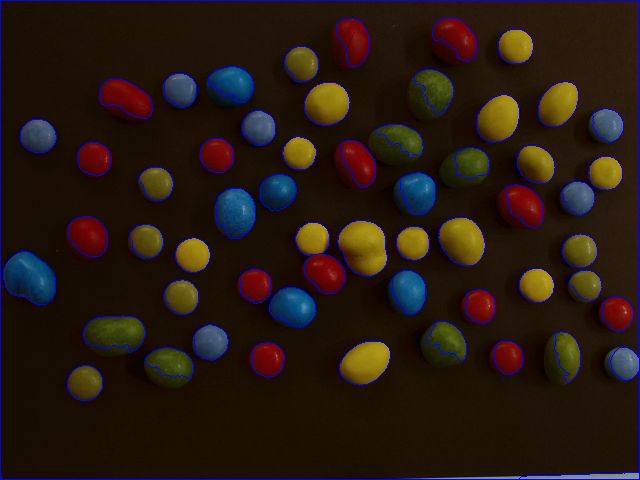

In [75]:
image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
assert image is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(image,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,31,255,cv.THRESH_BINARY )

kernel = np.ones((7,7),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 1)

sure_bg = cv.dilate(opening,kernel,iterations=7)

dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
ret, sure_fg = cv.threshold(dist_transform,0.3*dist_transform.max(),255,0)

sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)

ret, markers = cv.connectedComponents(sure_fg)

markers = markers+1
markers[unknown==255] = 0

markers = cv.watershed(image,markers)
image[markers == -1] = [255,0,0]

cv2_imshow(image)

Now lets count by color and type!

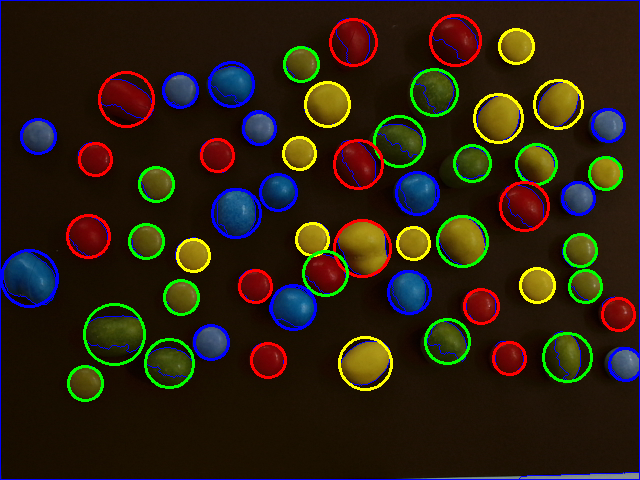

M&M Counts by Color and Type:
        Red  Blue  Green  Yellow
Peanut    7     6      8       4
Plain     7     8     10       6


In [76]:
def detect_color_using_ranges(hsv_region, color_ranges_dict):
    for color_name, ranges in color_ranges_dict.items():
        mask = 0
        for lower, upper in ranges:
            mask += cv.inRange(hsv_region, lower, upper)
        if cv.countNonZero(mask) > 0:  # If any pixel in the mask is active
            return color_name
    return "Unknown"

def classify_mms_type(radius, aspect_ratio):
    if radius > 20 or aspect_ratio > 1.2:  # Peanut configuration
        return "Peanut"
    else:
        return "Plain"

color_ranges_dict = {
    'Green': [
        (np.array([27, 100, 90]), np.array([50, 255, 255]))
    ],
    'Red': [
        (np.array([170, 150, 80]), np.array([180, 255, 220]))
    ],
    'Blue': [
        (np.array([100, 110, 60]), np.array([130, 150, 150]))
    ],
    'Yellow': [
        (np.array([20, 130, 20]), np.array([30, 255, 255]))
    ]
}

circle_colors = {
    'Green': (0, 255, 0),
    'Red': (0, 0, 255),
    'Blue': (255, 0, 0),
    'Yellow': (0, 255, 255),
}

mms_counts = {'Peanut': {}, 'Plain': {}}

image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
assert image is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray, 31, 255, cv.THRESH_BINARY)

# Noise removal
kernel = np.ones((7, 7), np.uint8)
opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=1)

# Identify sure background and foreground
sure_bg = cv.dilate(opening, kernel, iterations=7)
dist_transform = cv.distanceTransform(opening, cv.DIST_L2, 5)
ret, sure_fg = cv.threshold(dist_transform, 0.3 * dist_transform.max(), 255, 0)

# Define unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)

#Watershed
ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0
markers = cv.watershed(image, markers)
image[markers == -1] = [255, 0, 0]


for marker in range(2, np.max(markers) + 1):
    mask = np.zeros(gray.shape, dtype=np.uint8)
    mask[markers == marker] = 255

    # Extract contour and minimum enclosing circle radius
    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if contours:
        cnt = contours[0]
        (x, y), radius = cv.minEnclosingCircle(cnt)
        radius = int(radius)

        x, y, w, h = cv.boundingRect(cnt)
        aspect_ratio = float(w) / h if h != 0 else 1

        if aspect_ratio > 4:
            continue

        if radius < 9:
            continue

        hsv_region = cv.cvtColor(image[y:y+h, x:x+w], cv.COLOR_BGR2HSV)
        color_name = detect_color_using_ranges(hsv_region, color_ranges_dict)
        mms_type = classify_mms_type(radius, aspect_ratio)

        if color_name != "Unknown":
            if color_name not in mms_counts[mms_type]:
                mms_counts[mms_type][color_name] = 0
            mms_counts[mms_type][color_name] += 1

            circle_color = circle_colors.get(color_name, (255, 255, 255))

            center = (int(x + w / 2), int(y + h / 2))
            cv.circle(image, center, radius, circle_color, 2)


cv2_imshow(image)
mms_counts_table = pd.DataFrame.from_dict(mms_counts, orient='index').fillna(0).astype(int)
print("M&M Counts by Color and Type:")
print(mms_counts_table)

We can conclude that this technique improved the counting of the M&Ms and is almost perfect.



**Detections and Centroids**

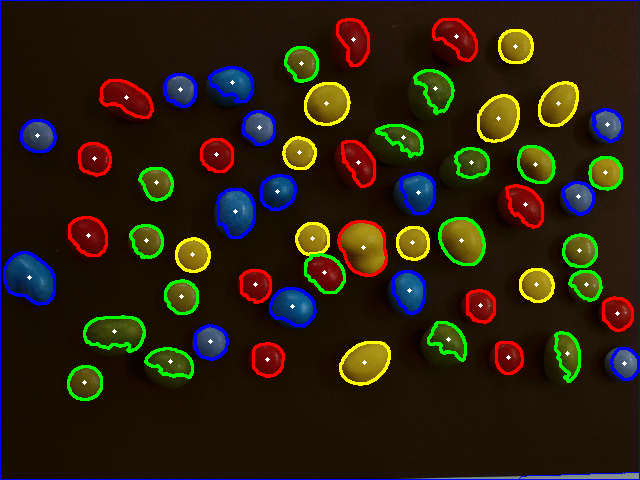

In [77]:
def detect_color_using_ranges(hsv_region, color_ranges_dict):
    for color_name, ranges in color_ranges_dict.items():
        mask = 0
        for lower, upper in ranges:
            mask += cv.inRange(hsv_region, lower, upper)
        if cv.countNonZero(mask) > 0:
            return color_name
    return "Unknown"

color_ranges_dict = {
    'Green': [
        (np.array([27, 100, 90]), np.array([50, 255, 255]))
    ],
    'Red': [
        (np.array([170, 150, 80]), np.array([180, 255, 220]))
    ],
    'Blue': [
        (np.array([100, 110, 60]), np.array([130, 150, 150]))
    ],
    'Yellow': [
        (np.array([20, 130, 20]), np.array([30, 255, 255]))
    ]
}

contour_colors = {
    'Green': (0, 255, 0),
    'Red': (0, 0, 255),
    'Blue': (255, 0, 0),
    'Yellow': (0, 255, 255),
}

image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
assert image is not None, "file could not be read, check with os.path.exists()"
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray, 31, 255, cv.THRESH_BINARY)
kernel = np.ones((7, 7), np.uint8)
opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=1)

sure_bg = cv.dilate(opening, kernel, iterations=7)
dist_transform = cv.distanceTransform(opening, cv.DIST_L2, 5)
ret, sure_fg = cv.threshold(dist_transform, 0.3 * dist_transform.max(), 255, 0)

sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)

ret, markers = cv.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0
#Watershed
markers = cv.watershed(image, markers)
image[markers == -1] = [255, 0, 0]

for marker in range(2, np.max(markers) + 1):
    mask = np.zeros(gray.shape, dtype=np.uint8)
    mask[markers == marker] = 255

    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if contours:
        cnt = contours[0]
        (x, y), radius = cv.minEnclosingCircle(cnt)
        radius = int(radius)

        x, y, w, h = cv.boundingRect(cnt)
        aspect_ratio = float(w) / h if h != 0 else 1

        if aspect_ratio > 4:
            continue
        if radius < 9:
            continue

        hsv_region = cv.cvtColor(image[y:y+h, x:x+w], cv.COLOR_BGR2HSV)
        color_name = detect_color_using_ranges(hsv_region, color_ranges_dict)

        contour_color = contour_colors.get(color_name, (255, 255, 255))  # White if unknown
        cv.drawContours(image, [cnt], -1, contour_color, 2)
        M = cv.moments(cnt)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            cv.circle(image, (cX, cY), 2, (255, 255, 255), -1)

cv2_imshow(image)

Without the watershed we can see that the results were indeed worst...

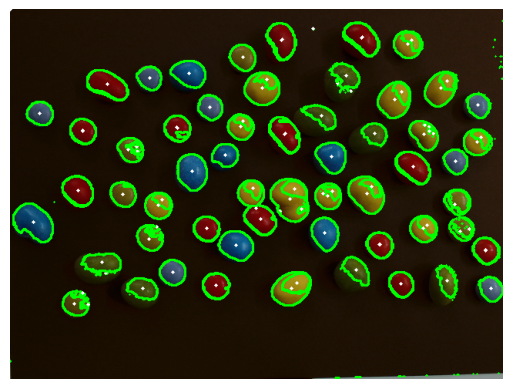

In [78]:
brown_image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
hsv = cv.cvtColor(brown_image, cv.COLOR_BGR2HSV)

lower_dark = np.array([0, 0, 0])
upper_dark = np.array([180, 255, 50])
mask = cv.inRange(hsv, lower_dark, upper_dark)

white_background = np.full_like(brown_image, 255)
mms_on_white_background = np.where(mask[:, :, None] == 0, brown_image, white_background)

hsv_mms = cv.cvtColor(mms_on_white_background, cv.COLOR_BGR2HSV)

color_ranges_dict = {
    'Green': [(np.array([30, 50, 50]), np.array([90, 255, 255])), (np.array([40, 50, 50]), np.array([70, 200, 200]))],
    'Red': [
        (np.array([0, 170, 60]), np.array([10, 255, 255])),
        (np.array([170, 170, 60]), np.array([180, 255, 255]))
    ],
    'Blue': [(np.array([100, 50, 50]), np.array([140, 255, 255]))],
    'Yellow': [(np.array([20, 150, 150]), np.array([30, 255, 255]))],
    'Brown': [
        (np.array([5, 100, 20]), np.array([25, 255, 255])),
        (np.array([0, 100, 20]), np.array([10, 255, 255])),
        (np.array([10, 100, 30]), np.array([20, 255, 200]))
    ]
}

for color_name, color_ranges in color_ranges_dict.items():
    mask = np.zeros_like(cv.inRange(hsv_mms, color_ranges[0][0], color_ranges[0][1]))

    for low, high in color_ranges:
        mask += cv.inRange(hsv_mms, low, high)

    contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        M = cv.moments(cnt)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            cX, cY = 0, 0

        cv.drawContours(brown_image, [cnt], -1, (0, 255, 0), 2)
        cv.circle(brown_image, (cX, cY), 2, (255, 255, 255), -1)

plt.imshow(cv.cvtColor(brown_image, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


Using the saturation threshold also gives worse results ...



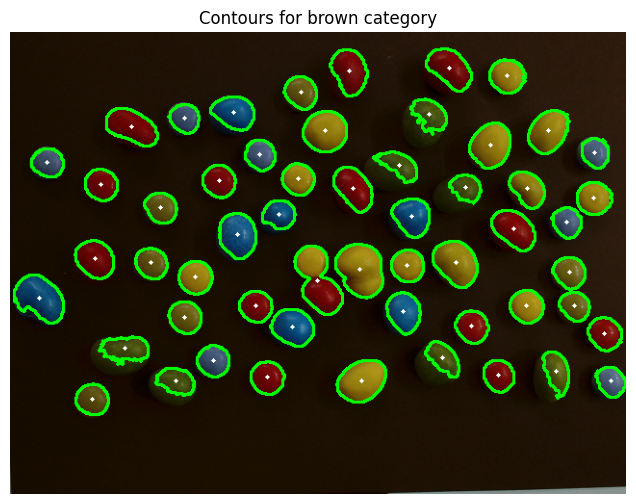

In [79]:
brown_image = cv.imread('/content/drive/MyDrive/VC/brown_mix/brown_most.png')
hsv = cv.cvtColor(brown_image, cv.COLOR_BGR2HSV)

lower_dark = np.array([0, 0, 0])
upper_dark = np.array([180, 255, 50])
mask = cv.inRange(hsv, lower_dark, upper_dark)

white_background = np.full_like(brown_image, 255)
mms_on_white_background = np.where(mask[:, :, None] == 0, brown_image, white_background)

hsv_mms = cv.cvtColor(mms_on_white_background, cv.COLOR_BGR2HSV)

mask_saturation = hsv_mms[:, :, 1] > 60

contours, _ = cv.findContours(mask_saturation.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

contour_areas = []

image_with_contours = brown_image.copy()

for contour in contours:
    area = cv.contourArea(contour)

    if area < 5:
        continue
    contour_areas.append(area)

    M = cv.moments(contour)
    if M["m00"] != 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
    else:
        cX, cY = 0, 0

    cv.drawContours(image_with_contours, [contour], -1, (0, 255, 0), 2)
    cv.circle(image_with_contours, (cX, cY), 2, (255, 255, 255), -1)

sorted_areas = sorted(contour_areas, reverse=True)

image_with_contours_rgb = cv.cvtColor(image_with_contours, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(image_with_contours_rgb)
plt.title(f'Contours for brown category')
plt.axis('off')
plt.show()



Finaly, finding the perfect range for each color was definitely the most challenging task, but we feel that we managed to get a final count that closely reflects reality. Colors like yellow and green were the hardest, and even for us, with the human eye, they are difficult to distinguish in this image. We leave for future work to perfect these ranges.


## Conclusion

This project was very challenging, but it provided an excellent opportunity to explore and experiment various approaches. Moving forward and as future work, we could enhance our approach by exploring more (advanced) techniques and refining the color ranges across all of the questions.

# References




[1] https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

[2] https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d




# Attachements


This attachment was included just to justify that there are no huge differences in the HSV plots between distorted and undistorted figures.

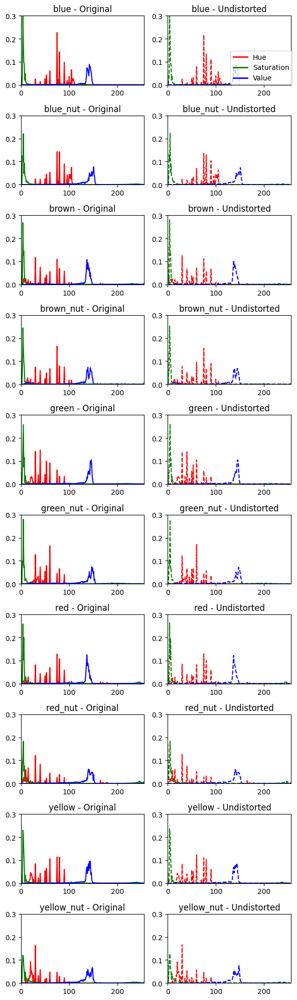

In [80]:
fig, axes = plt.subplots(len(categories), 2, figsize=(6, len(categories) * 2))
axes = axes.ravel()

categories = ["blue", "blue_nut", "brown", "brown_nut", "green", "green_nut", "red", "red_nut", "yellow", "yellow_nut"]

for i, category in enumerate(categories):
    x, y, w, h = roi_nut if "nut" in category else roi_normal

    image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated/{category}.png')

    if image_files:
        image = cv.imread(image_files[0])

        roi = image[y:y+h, x:x+w]

        roi_hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)

        h_hist_original = cv.calcHist([roi_hsv], [0], None, [256], [0, 256])  # Hue histogram: 0-180
        s_hist_original = cv.calcHist([roi_hsv], [1], None, [256], [0, 256])  # Saturation histogram: 0-255
        v_hist_original = cv.calcHist([roi_hsv], [2], None, [256], [0, 256])  # Value histogram: 0-255

        h_hist_original = h_hist_original / h_hist_original.sum()
        s_hist_original = s_hist_original / s_hist_original.sum()
        v_hist_original = v_hist_original / v_hist_original.sum()

        axes[2 * i].plot(h_hist_original, color='r', label='Hue - Original')
        axes[2 * i].plot(s_hist_original, color='g', label='Saturation - Original')
        axes[2 * i].plot(v_hist_original, color='b', label='Value - Original')
        axes[2 * i].set_xlim([0, 256])  # Set x-axis for Hue to 0-180 (not 0-256)
        axes[2 * i].set_ylim(0, 0.3)  # Set y-axis limits (you can adjust this based on your data)
        axes[2 * i].set_title(f'{category} - Original')
        axes[2 * i].axis('on')

        undistorted_image_files = glob.glob(f'/content/drive/MyDrive/VC/white_isolated_undistorted/{category}_undistorted.png')
        if undistorted_image_files:
            undistorted_image = cv.imread(undistorted_image_files[0])

            roi_undistorted = undistorted_image[y:y+h, x:x+w]
            roi_hsv_undistorted = cv.cvtColor(roi_undistorted, cv.COLOR_BGR2HSV)

            h_hist_undistorted = cv.calcHist([roi_hsv_undistorted], [0], None, [256], [0, 256])  # Hue histogram: 0-180
            s_hist_undistorted = cv.calcHist([roi_hsv_undistorted], [1], None, [256], [0, 256])  # Saturation histogram: 0-255
            v_hist_undistorted = cv.calcHist([roi_hsv_undistorted], [2], None, [256], [0, 256])  # Value histogram: 0-255

            h_hist_undistorted = h_hist_undistorted / h_hist_undistorted.sum()
            s_hist_undistorted = s_hist_undistorted / s_hist_undistorted.sum()
            v_hist_undistorted = v_hist_undistorted / v_hist_undistorted.sum()

            axes[2 * i + 1].plot(h_hist_undistorted, color='r', linestyle='--', label='Hue - Undistorted')
            axes[2 * i + 1].plot(s_hist_undistorted, color='g', linestyle='--', label='Saturation - Undistorted')
            axes[2 * i + 1].plot(v_hist_undistorted, color='b', linestyle='--', label='Value - Undistorted')
            axes[2 * i + 1].set_xlim([0, 256])  # Set x-axis for Hue to 0-180 (not 0-256)
            axes[2 * i + 1].set_ylim(0, 0.3)  # Set y-axis limits (you can adjust this based on your data)
            axes[2 * i + 1].set_title(f'{category} - Undistorted')
            axes[2 * i + 1].axis('on')

handles = [plt.Line2D([0], [0], color='r', lw=2, label='Hue'),
           plt.Line2D([0], [0], color='g', lw=2, label='Saturation'),
           plt.Line2D([0], [0], color='b', lw=2, label='Value')]

fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.99, 0.95))

plt.tight_layout()
plt.show()
